In [24]:
import librosa
import librosa.display
import scipy as sp
import IPython.display as ipd
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf

In [73]:
# load audio file in the player
audio_path = "input/Nums_5dot1_24_48000.wav"
ipd.Audio(audio_path)

In [148]:
# load audio file
signal, sr = librosa.load(audio_path)

def dft(audio_signal,db_array):
    # Compute DFT using FFT algorithm
    spectrum = np.fft.fft(audio_signal)
    magnitude = np.abs(spectrum)
    converted_mag = [np.power(10, db/20) for db in db_array]

    print(magnitude)
    magnitude[0:60] = converted_mag[0] * magnitude[0:60]
    magnitude[61:230] = converted_mag[1] * magnitude[61:230]
    magnitude[231:910] = converted_mag[2] * magnitude[231:910]
    magnitude[911:4000] = converted_mag[3] * magnitude[911:4000]
    magnitude[4001:11000] = converted_mag[3] * magnitude[4001:11000]

    print(magnitude)
    phase = np.angle(spectrum)
    return magnitude, phase

def inverse_dft(magnitude, phase):
    # Compute Inverse DFT
    spectrum = magnitude * np.exp(1j * phase)
    audio_signal = np.fft.ifft(spectrum)
    return np.real(audio_signal)

mag, phase = dft(signal,[0, -10, -10, -10, -10])

new_file = inverse_dft(mag, phase)
sampling_rate = 22050
sf.write('something.wav', new_file, sampling_rate)



[0.03235928 0.03434317 0.02869668 ... 0.01515802 0.02869668 0.03434317]
[0.03235928 0.03434317 0.02869668 ... 0.01515802 0.02869668 0.03434317]


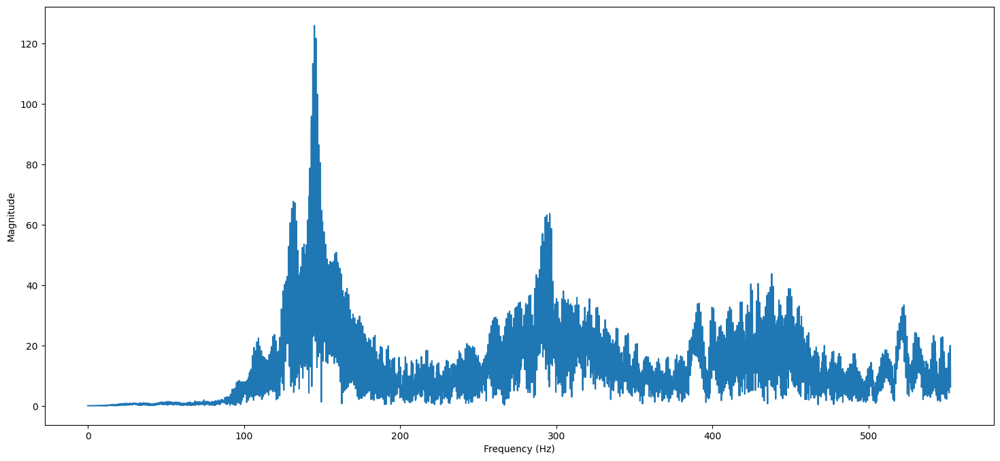

In [143]:

# load audio file
signal, sr = librosa.load(audio_path)
ft = sp.fft.fft(signal)
magnitude = np.absolute(ft)
frequency = np.linspace(0, sr, len(magnitude)) 
plt.figure(figsize=(18, 8))
plt.plot(frequency[:5000], magnitude[:5000]) # magnitude spectrum
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.show()

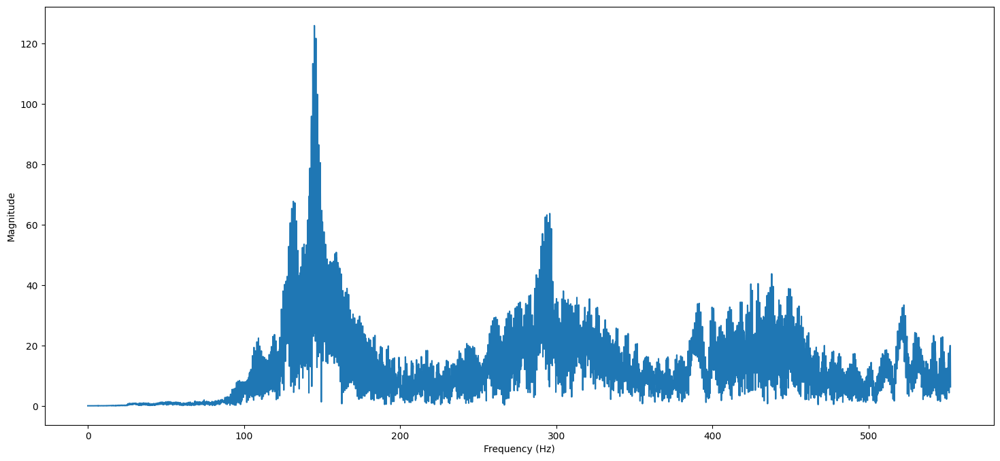

In [144]:
ft = sp.fft.fft(new_file)
magnitude = np.absolute(ft)
frequency = np.linspace(0, sr, len(magnitude)) 
plt.figure(figsize=(18, 8))
plt.plot(frequency[:5000], mag[:5000]) # magnitude spectrum
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.show()